In [1]:
import numpy as np
import matplotlib.pyplot as plt
import emcee
from corner import corner

import brick

plt.style.use('science')

In [2]:
import model_bayes as model

In [3]:
azr = brick.AZR('model_bayes.azr')

In [4]:
len([p.label for p in azr.parameters])

15

In [5]:
azr.config.n1, azr.config.n2, azr.config.nd

(15, 13, 28)

In [6]:
import constants as const

In [7]:
const.som_syst.size

7

In [8]:
model.ln_posterior(model.starting_positions)

(1333.2978490113298, 1509.3216743572798)

In [9]:
backend = emcee.backends.HDFBackend('/Users/danielodell/Downloads/model_bayes_2023-06-29-00-04-30.h5')

In [12]:
lnp = backend.get_log_prob()

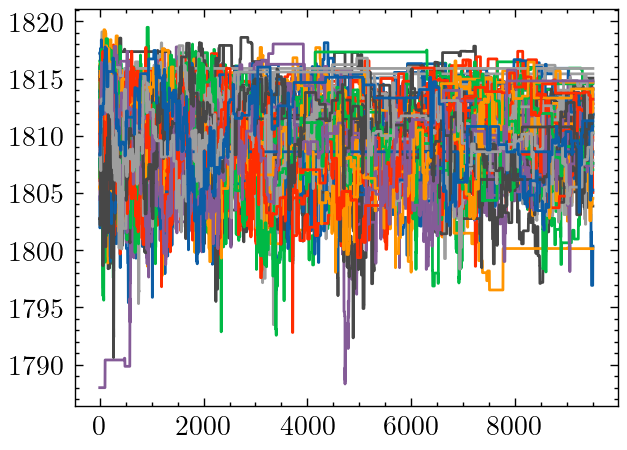

In [14]:
nb = 500
fig, ax = plt.subplots(dpi=200)
fig.patch.set_facecolor('white')

ax.plot(lnp[nb:]);

In [15]:
emcee.autocorr.integrated_time(backend.get_chain(discard=nb))

AutocorrError: The chain is shorter than 50 times the integrated autocorrelation time for 28 parameter(s). Use this estimate with caution and run a longer chain!
N/50 = 190;
tau: [668.05851352 707.3000702  613.65423518 710.56944322 666.98821658
 692.85825803 903.34293274 713.96527882 764.7999938  759.79452722
 649.58390448 692.36282824 645.34602152 748.19674802 918.99972418
 574.05034993 582.45039372 602.7898228  561.29513477 485.59897887
 589.0888791  526.86990315 542.46092416 605.09293941 582.18090619
 568.05949074 550.68615244 535.78845244]

In [17]:
model.azr.config.labels

['$C_{1,1}^{(-0.5)}$',
 '$\\Gamma_{2,1}^{(-0.5)}$',
 '$\\Gamma_{1,1}^{(+0.5)}$',
 '$\\Gamma_{1,2}^{(+0.5)}$',
 '$\\Gamma_{1,3}^{(+0.5)}$',
 '$C_{1,1}^{(-1.5)}$',
 '$\\Gamma_{2,1}^{(-1.5)}$',
 '$\\Gamma_{1,1}^{(+1.5)}$',
 '$\\Gamma_{1,2}^{(+1.5)}$',
 '$\\Gamma_{1,3}^{(+1.5)}$',
 '$\\Gamma_{1,1}^{(-2.5)}$',
 '$\\Gamma_{1,1}^{(+2.5)}$',
 '$\\Gamma_{1,2}^{(+2.5)}$',
 '$\\Gamma_{1,1}^{(-3.5)}$',
 '$\\Gamma_{1,2}^{(-3.5)}$',
 '$n_{9}$',
 '$n_{10}$',
 '$n_{11}$',
 '$n_{12}$',
 '$n_{13}$',
 '$n_{14}$',
 '$n_{15}$',
 '$n_{16}$',
 '$n_{17}$',
 '$n_{18}$',
 '$n_{19}$',
 '$n_{20}$',
 '$n_{21}$']

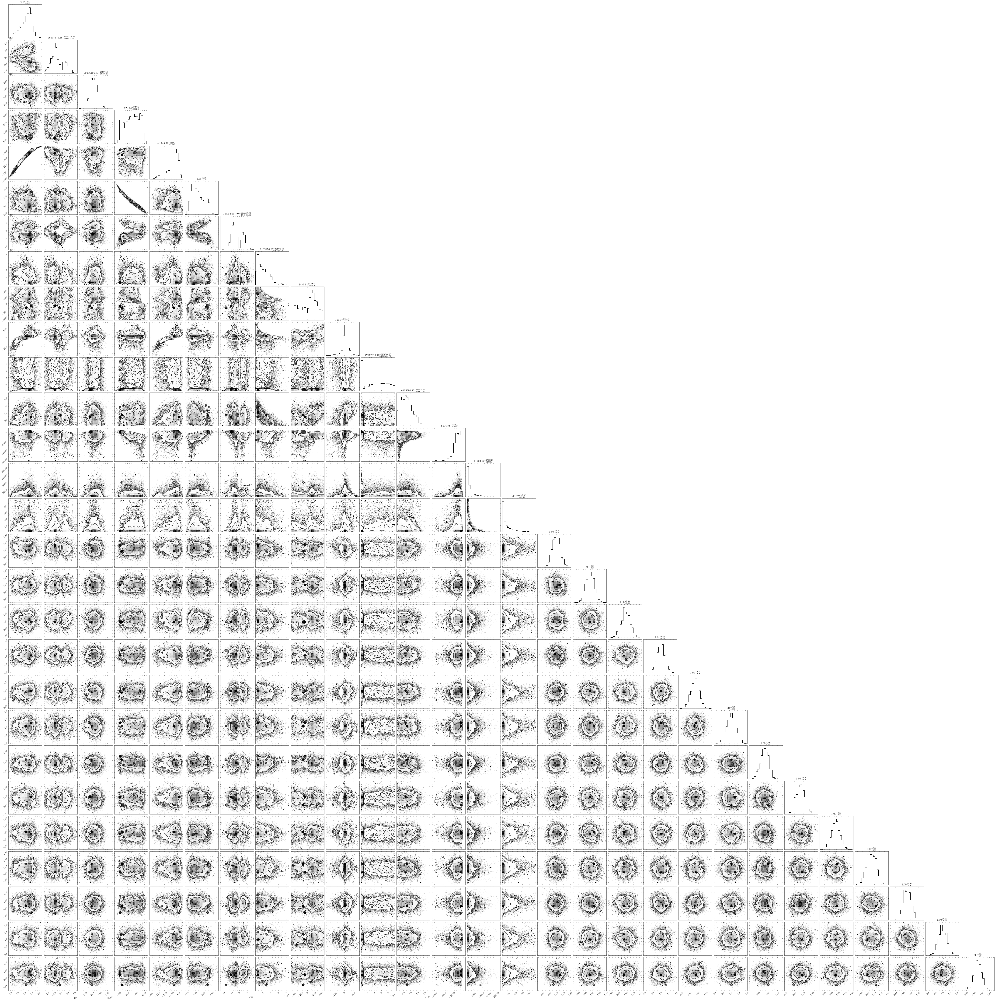

In [16]:
fig = corner(backend.get_chain(discard=nb, thin=10, flat=True), show_titles=True)